In [61]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import datetime

import os
import scipy
import scikit_posthocs as sp
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px

# Load Statsmodels 
import statsmodels.api as sm
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
from statsmodels.stats.multicomp import pairwise_tukeyhsd

import plotly
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
plotly.offline.init_notebook_mode(connected=True)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
# Configure Pandas to display all columns and rows
pd.set_option("display.max.columns", None)
pd.set_option("display.max.rows", None)
# Suitable default display for floats
pd.options.display.float_format = '{:,.2f}'.format

%matplotlib inline
plt.rcParams["figure.figsize"] = (10,8)
sns.set_style("whitegrid")
sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))

## What is the problem at hand?

### `Sources`

**https://letstalkscience.ca/educational-resources/backgrounders/understanding-electricity-supply-and-demand#:~:text=Oversupply%20happens%20when%20suppliers%20generate,electricity%20can't%20be%20stored.**

**https://www.propmodo.com/how-energy-forecasting-saves-money-and-resources/#:~:text=Advancements%20in%20sensors%20and%20software,more%20efficient%2C%20and%20more%20sustainable.**

**Electrical utilities need to efficiently plan the allocation of generating units in their power plants to match their energy demand because if the demand is higher than the generation, it can cause several blackouts resulting in a huge loss to the economy. And, if the generation is higher than the demand the extra electricity will be wasted and it can also create an unnecessary load on the transmission lines.**

**Hence, it is important for the utilities to have a forecast of the energy consumption to be able to allocate appropriate resources to meet their demand. A month, week or day-ahead forecast can help the utilities plan for a larger time scale, but for smoother daily operations an hourly forecast can prove very useful. For example, if the plant operators get a high energy forecast for the next hour, they can ramp up the energy supply by switching on more power plants.**

## Potential solution?

**`Using 10 years worth of hourly energy consumption data, we could try to learn from the trends and signals and build a model to effectively forecase energy consumption for a single day. The energy comanies could utilize this model to better plan for future and in-return not only help the economy running but also reduce energy wastage.`**

## Load energy data

In [104]:
energy_df = pd.read_csv('data/power_data.csv', index_col=0)

## Explore data

In [105]:
# data types of the columns

energy_df.dtypes

Datetime      object
Power_MWH    float64
dtype: object

**There are two columns in the data - date and power consumption. Power consumption is measured in MWH**

**What is MW/MWh?** <br>
`Megawatts/Megawatt Hours: A measure of electricity equal to 1 million watts. A megawatt hour is a measure of electricity generation of 1 MW produced over one hour.`

In [106]:
# rename columns for simplicity

energy_df.rename(columns={'Datetime': 'dates', 'Power_MWH': 'power_mwh'}, inplace=True)

# conver the date col to datetime
energy_df['dates'] = pd.to_datetime(energy_df['dates'])

energy_df.dtypes

dates        datetime64[ns]
power_mwh           float64
dtype: object

In [107]:
# shape 

energy_df.shape

(75255, 2)

**There are `75255` hours of data.**

### Is there any missing data?

In [108]:
energy_df.isnull().sum()

dates        0
power_mwh    0
dtype: int64

**There is no missing data - that is great!**

In [8]:
energy_df.head()

,dates,power_mwh
0,2010-01-01 00:00:00,"31,647.00"
1,2010-12-31 01:00:00,"29,634.00"
2,2010-12-31 02:00:00,"28,614.00"
3,2010-12-31 03:00:00,"28,146.00"
4,2010-12-31 04:00:00,"28,051.00"


In [9]:
energy_df.tail()

,dates,power_mwh
75250,2018-01-01 20:00:00,"44,284.00"
75251,2018-01-01 21:00:00,"43,751.00"
75252,2018-01-01 22:00:00,"42,402.00"
75253,2018-01-01 23:00:00,"40,164.00"
75254,2018-01-02 00:00:00,"38,608.00"


### Descriptive statistics

In [10]:
energy_df.describe()

,power_mwh
count,"75,255.00"
mean,"31,729.89"
std,"6,503.00"
min,"14,544.00"
25%,"27,233.50"
50%,"30,838.00"
75%,"35,353.50"
max,"61,646.00"


**Looks like the average power consumption based on our data is - `31,729 MWH`**

### Checking the number of rows in each year 

In [11]:
energy_df.groupby(energy_df['dates'].dt.year)['power_mwh'].count().reset_index()

,dates,power_mwh
0,2010,8757
1,2011,8758
2,2012,8782
3,2013,8758
4,2014,8760
5,2015,8760
6,2016,8784
7,2017,8760
8,2018,5136


In [12]:
energy_df[energy_df.dates.dt.year==2018].head()

,dates,power_mwh
61383,2018-01-01 00:00:00,"39,928.00"
70120,2018-08-02 01:00:00,"34,283.00"
70121,2018-08-02 02:00:00,"32,094.00"
70122,2018-08-02 03:00:00,"30,543.00"
70123,2018-08-02 04:00:00,"29,791.00"


**Looks like a few dates are missing in the data, especially in the year 2018.**

## Visualize data - EDA

In [45]:
fig = px.line(energy_df, x='dates', y=col, 
              labels={'date': 'Year-Month-Day-Hour', 'power_mwh': 'Power Consumption - MWH'},
              title="Hourly Power Consumption over the years 2010-2018")
fig.show()

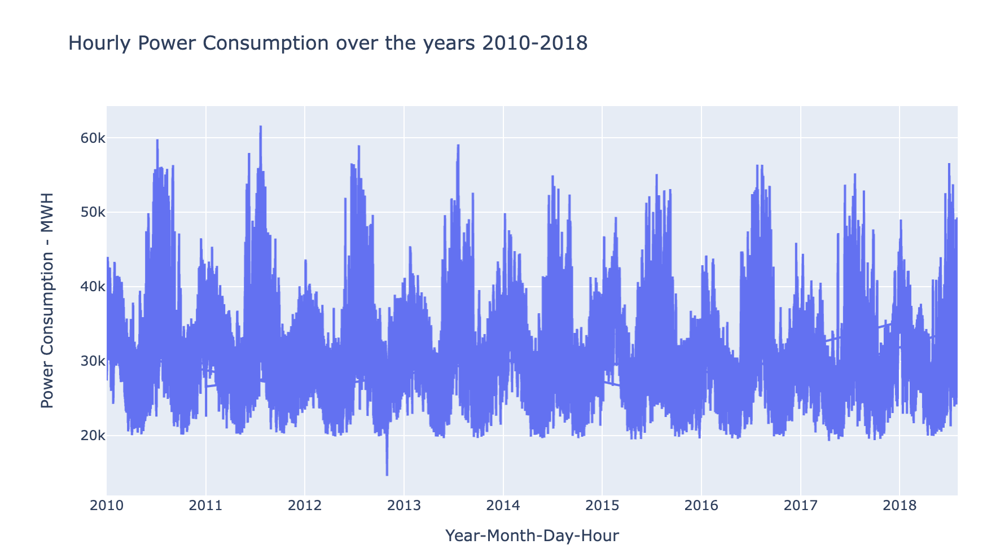

**The Power consumption data across 10 years seems non-stationary with seasonality! There doesn't seem to be a trend present but certainly seasonality. We can verify stationarity with a statistical test**

## Statistical test to check stationarity in time series 

**We will experiment with `Augmented Dickey-Fuller (ADF)`**

**Null Hypothesis (HO): Series is non-stationary.**

**Alternate Hypothesis(HA): Series is stationary.**

In [50]:
# Changing the YEAR data type and setting it as index
df = energy_df.copy()
df.index = df['dates']

del df['dates']

# ADF Test
from statsmodels.tsa.stattools import adfuller

def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
    
# Run test
adf_test(df['power_mwh'])


Results of Dickey-Fuller Test:
Test Statistic                   -14.16
p-value                            0.00
#Lags Used                        63.00
Number of Observations Used   75,191.00
Critical Value (1%)               -3.43
Critical Value (5%)               -2.86
Critical Value (10%)              -2.57
dtype: float64


**The p-value is significant and hence, we can reject the null hypothesis and as expected, declare that the time series is infact stationary.**

## Feature Engineering

In [109]:
def season_calc(month):
    """ Adding season based on general understanding since we aren't aware of which city this data is from.
        months from June to October are denoted as 'summer' and months from November to May as 'winter'. """
    if month in [6,7,8,9,10]:
        return "summer"
    else:
        return "winter"
      
weekdays = {0:'Monday', 1:'Tuesday', 2:'Wednesday', 3: 'Thursday', 4: 'Friday', 5:'Saturday', 6:'Sunday'}

energy_df['year'] = energy_df.dates.dt.year
energy_df['month'] = energy_df.dates.dt.month
energy_df['day'] = energy_df.dates.dt.day
energy_df['hour'] = energy_df.dates.dt.hour
energy_df['weekday'] = energy_df.dates.dt.weekday.map(weekdays)
energy_df['season'] = energy_df.dates.dt.month.apply(season_calc)

# Adding holidays column to indicate whether a day was a holiday assuming this data is from US

cal = calendar()
holidays = cal.holidays(start = energy_df['dates'].min(), end = energy_df['dates'].max())
energy_df['holiday'] = energy_df['dates'].isin(holidays)

# converting the holiday column to 1 and 0, 1 indicating a holiday and 0 not a holiday

mapped = {True:1, False:0}
energy_df.holiday = energy_df.holiday.map(mapped)
energy_df.head()

#adding in another column which indicates 'non-working' days which include weekends and holidays
energy_df['non_working'] = energy_df.apply(lambda x: 'non-working' if \
                                          ((x['holiday'] == 1) or (x['weekday'] in ['Saturday', 'Sunday']))
                                           else 'working', axis = 1)

energy_df.head()


,dates,power_mwh,year,month,day,hour,weekday,season,holiday,non_working
0,2010-01-01 00:00:00,"31,647.00",2010,1,1,0,Friday,winter,1,non-working
1,2010-12-31 01:00:00,"29,634.00",2010,12,31,1,Friday,winter,0,working
2,2010-12-31 02:00:00,"28,614.00",2010,12,31,2,Friday,winter,0,working
3,2010-12-31 03:00:00,"28,146.00",2010,12,31,3,Friday,winter,0,working
4,2010-12-31 04:00:00,"28,051.00",2010,12,31,4,Friday,winter,0,working


In [14]:
from pandas.api.types import CategoricalDtype

energy_df['season'] = energy_df['season'].astype(CategoricalDtype(categories=['summer', 'winter'], ordered=True))
energy_df['weekday'] = energy_df['weekday'].astype(CategoricalDtype(categories=['Monday', 'Tuesday', 'Wednesday',
                                                                                'Thursday', 'Friday', 
                                                                                'Saturday', 'Sunday'], 
                                                                    ordered=True))
energy_df['non_working'] = energy_df['non_working'].astype(CategoricalDtype(categories=['working', 'non-working'], ordered=True))


In [110]:
df = energy_df.copy()

### Zooming into one year at a time

In [141]:
from typing import List

def zoom_trends_by_time_period(
    df: pd.DataFrame,
    year: int,
    time_period: int,
    time_period_col: str,
    cols_to_include: List[str]
):
    time_df = df[(df.dates.dt.year==year) & (df[f'{time_period_col}']==time_period)]
    time_df = time_df[cols_to_include]
    time_df['dates'] = pd.to_datetime(time_df.dates.dt.date)
    
    for col in time_df.columns:
        
        if col not in ['dates', 'power_mwh']:
            fig = px.line(time_df, x='dates', y='power_mwh', 
                          labels={'dates': f'{col}', 'power_mwh': 'Power Consumption - MWH'},
                          title=f"{time_period} - Power Consumption over the year {year}",
                          color=col)
            fig.show()


In [154]:
def visualize_zoomed_consumption(
df: pd.DataFrame,
time_period_col: str
):
    df_hour_grouped = df.groupby(f'{time_period_col}')['power_mwh'].mean().reset_index()

    fig = px.line(df_hour_grouped, x=f'{time_period_col}', y='power_mwh', 
                              labels={'power_mwh': 'Power Consumption - MWH'},
                              title=f'{time_period_col} Power consumption in MWH averaged over 10 years (2010-18)',
    )

    fig.show()
    

In [155]:
visualize_zoomed_consumption(df, 'hour')

**From the above average hourly load profile graph we can observe how the load remains low over the night and then starts increasing as the region wakes up, and continues increasing during the office hours and peaks in the evening when everyone returns home and turns on the electrical appliances in their house.**

### Plotting average monthly load profile over the entire period 2014-18

In [156]:
visualize_zoomed_consumption(df, 'month')

**As expected the monthly load profile peaks the most in the summer due to high cooling (air-conditioning) load caused by high temperatures.**

In [157]:
visualize_zoomed_consumption(df, 'day')

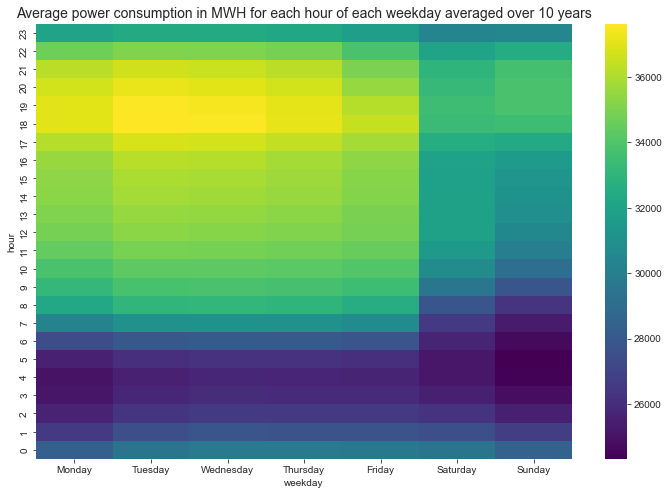

In [16]:
hour_weekday = df.pivot_table(values='power_mwh', index='hour', columns = 'weekday', aggfunc = 'mean')

#plotting a heatmap with a colorbar; the colorbar shows the energy consumption in MWH

plt.figure(figsize=(12, 8))
ax = sns.heatmap(hour_weekday.sort_index(ascending = False), cmap='viridis')
ax.set_title("Average power consumption in MWH for each hour of each weekday averaged over 10 years", fontsize = 14)


**It can be seen that the average consumption from Monday to Friday is below 2000 in the night and it increases during the day and is at peak (>2800) during the evening time before sliding down again for the night. And on the weekends the same pattern can be observed but the overall consumption seems lower on weekends than weekdays as expected because most of the commercial buildings don't operate on weekends (also maybe because people go out on weekends and are not usually at home?)**

### Plotting a histogram to see the overall distribution of the power consumption over the years

/usr/local/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



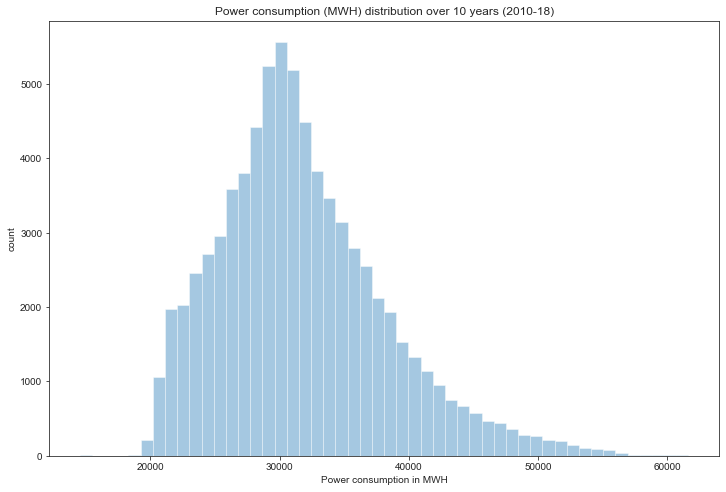

In [17]:
plt.figure(figsize = (12,8))
sns.distplot(df['power_mwh'], kde=False)
plt.title('Power consumption (MWH) distribution over 10 years (2010-18)')
plt.xlabel('Power consumption in MWH')
plt.ylabel('count')



### Visualize categorical variables

In [32]:
def visualize_zoomed_consumption_by_cat(
df: pd.DataFrame,
time_period_col: str,
cat_order: List[str]
):
    fig = px.box(df, x = f'{time_period_col}', y = 'power_mwh', 
             category_orders={"weekday": cat_order},
             labels={'power_mwh': 'Power Consumption - MWH'}
            )
    fig.show()

### Box Plot distribution of power consumption by weekdays

In [33]:
visualize_zoomed_consumption_by_cat(df, 'weekday', ["Monday", "Tuesday", "Wednesday", "Thursday",
                                                    "Friday", "Saturday", "Sunday"])

In [34]:
visualize_zoomed_consumption_by_cat(df, 'season', ["summer", "winter"])

In [35]:
visualize_zoomed_consumption_by_cat(df, 'non_working', ["working", "non_working"])

## Run statistical tests to understand impact of features on power consumption

**Run ANOVA, Kruskal-Wallis and post hoc tests for the categorical features to understand if the group means are statistically significant.**

In [76]:
anova_args = tuple(df.groupby('weekday')['power_mwh'].apply(list).reset_index()['power_mwh'])
f_statistic, p_value = scipy.stats.f_oneway(*anova_args)

print(f_statistic, p_value)

584.0026954994083 0.0


In [71]:
# perform multiple pairwise comparison (Tukey HSD)
m_comp = pairwise_tukeyhsd(endog=df['power_mwh'], groups=df['weekday'], alpha=0.05)
print(m_comp)

       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1    group2   meandiff  p-adj    lower      upper    reject
-----------------------------------------------------------------
  Friday    Monday   -50.3985    0.9  -306.0213   205.2243  False
  Friday  Saturday  -2350.761  0.001 -2606.3838 -2095.1382   True
  Friday    Sunday -3001.5979  0.001 -3257.2743 -2745.9216   True
  Friday  Thursday   409.1778  0.001    153.555   664.8006   True
  Friday   Tuesday   545.6799  0.001   290.0571   801.3027   True
  Friday Wednesday   567.6015  0.001   311.9787   823.2243   True
  Monday  Saturday -2300.3624  0.001 -2555.9852 -2044.7397   True
  Monday    Sunday -2951.1994  0.001 -3206.8757 -2695.5231   True
  Monday  Thursday   459.5764  0.001   203.9536   715.1992   True
  Monday   Tuesday   596.0784  0.001   340.4556   851.7012   True
  Monday Wednesday      618.0  0.001   362.3772   873.6228   True
Saturday    Sunday   -650.837  0.001  -906.5133  -395.1606   True
Saturday  

In [64]:
kruskal_args = tuple(df.groupby('season')['power_mwh'].apply(list).reset_index()['power_mwh'])
h_statistic, p_value = scipy.stats.kruskal(*kruskal_args)
print(p_value)

0.0


In [73]:
# perform multiple pairwise comparison (Tukey HSD)
m_comp = pairwise_tukeyhsd(endog=df['power_mwh'], groups=df['season'], alpha=0.05)
print(m_comp)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff  p-adj   lower      upper    reject
-----------------------------------------------------------
summer winter -2611.7819 0.001 -2704.3725 -2519.1914   True
-----------------------------------------------------------


In [75]:
kruskal_args = tuple(df.groupby('non_working')['power_mwh'].apply(list).reset_index()['power_mwh'])
h_statistic, p_value = scipy.stats.kruskal(*kruskal_args)
print(p_value)

0.0


In [74]:
# perform multiple pairwise comparison (Tukey HSD)
m_comp = pairwise_tukeyhsd(endog=df['power_mwh'], groups=df['non_working'], alpha=0.05)
print(m_comp)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
   group1    group2  meandiff p-adj  lower     upper   reject
-------------------------------------------------------------
non-working working 2976.9763 0.001 2876.465 3077.4876   True
-------------------------------------------------------------


## Generate ACF and PACF plots

#### Few feature engineering approaches to experiment with - 

- **Lagged features for the target variable**
- **Rolling window feature.**

### For lagged features - plot ACF plots and PACF plots

- `ACF plots helps to understand the correlation between time series and the lagged version of itself.`
- `PACF plots helps to understand the correlation between the time series with a lagged version of itself but after    eliminating the variations already explained by the intervening comparisons.`

Text(0.5, 1.0, 'PACF plot for power_mwh')

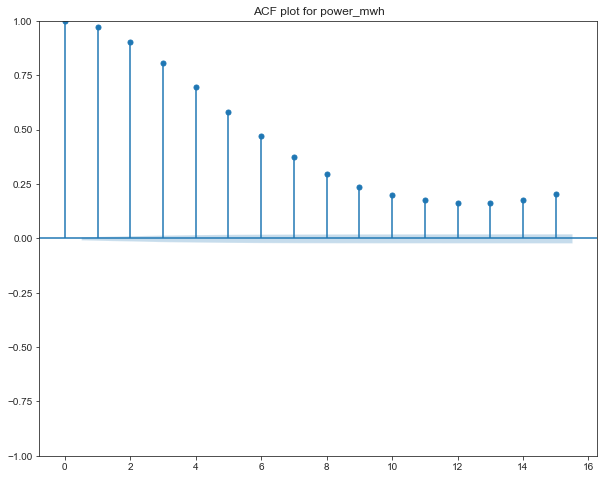

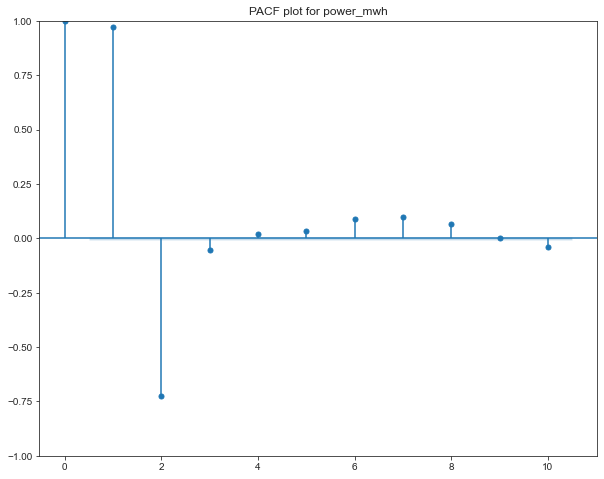

In [80]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

       
plot_acf(df['power_mwh'], lags=15)
plt.title('ACF plot for power_mwh')

plot_pacf(df['power_mwh'], lags=10, method='ols')
plt.title('PACF plot for power_mwh')

- **`There are several autocorrelations that are significantly non-zero. Therefore, the time series is non-random and is not white noise.`** <br>
- **`High degree of autocorrelation between adjacent (lag = 1) and near-adjacent (lag = 2) observations in PACF plot`**
- **`High degree of autocorrelation between several adjacent lag observations in ACF plot.`**

## Create lagged features

In [111]:
def get_lagged_features(df, col):
    
    df_lagged = df.copy()
      
    df_lagged[f'{col}_lag_1'] = df_lagged[col].shift(1)
    df_lagged[f'{col}_lag_2'] = df_lagged[col].shift(2)
    df_lagged[f'{col}_lag_3'] = df_lagged[col].shift(3)
    

    df_lagged = df_lagged.fillna(method='bfill')
    
    return df_lagged

df_lagged = get_lagged_features(df, 'power_mwh')
df_lagged.shape

(75255, 13)

## Create rolling window features

In [112]:
def get_rolling_window_features(df, col):
    
    df_rolling_window = df.copy()
      
    df_rolling_window[f'{col}_rolling_mean'] = df_rolling_window[col].rolling(window=7).mean()
    df_rolling_window = df_rolling_window.fillna(method='bfill')
    
    return df_rolling_window

df_rolling_window = get_rolling_window_features(df_lagged, 'power_mwh')
df_rolling_window.shape

(75255, 14)

In [113]:
df_rolling_window.head()

,dates,power_mwh,year,month,day,hour,weekday,season,holiday,non_working,power_mwh_lag_1,power_mwh_lag_2,power_mwh_lag_3,power_mwh_rolling_mean
0,2010-01-01 00:00:00,"31,647.00",2010,1,1,0,Friday,winter,1,non-working,"31,647.00","31,647.00","31,647.00","29,188.71"
1,2010-12-31 01:00:00,"29,634.00",2010,12,31,1,Friday,winter,0,working,"31,647.00","31,647.00","31,647.00","29,188.71"
2,2010-12-31 02:00:00,"28,614.00",2010,12,31,2,Friday,winter,0,working,"29,634.00","31,647.00","31,647.00","29,188.71"
3,2010-12-31 03:00:00,"28,146.00",2010,12,31,3,Friday,winter,0,working,"28,614.00","29,634.00","31,647.00","29,188.71"
4,2010-12-31 04:00:00,"28,051.00",2010,12,31,4,Friday,winter,0,working,"28,146.00","28,614.00","29,634.00","29,188.71"


In [103]:
df_with_features = df_rolling_window.copy()
df_with_features.to_csv('data/power_data_with_features.csv', index=False)